In [ ]:
''' 
This capsule is provided to reproduce the results of the manuscript entitled
"Audiogram Detection AI Trained Using Size-Fixed Frame and Bounding-Boxes"

Datasets:
data/datasets/training_datasets directory contains the following training/validation datasets:
    1. DatasetA (rect416 images) for DETR or YOLO training
    2. DatasetB (original images) for DETR training
    3. DatasetC (original images) for YOLO training

data/datasets/test_datasets directory contains the following test datasets (in YOLO format):
    1. Original test dataset
    2. Original test dataset without photo images
    3. Rect416 test dataset

Models:
data/models/
    1. rect416DETR_audiogramdetr_checkpoint0499.pth (trained with datasetA)
        classes: a0 (right air-conduction threshold), a1 (right bone-conduction threshold), 
        a2 (left air-conduction threshold), a3 (left bone-conduction threshold), 
        and a4 (overlapping right and left air-conduction thresholds).
    2. rect416YOLO_audiogramdetr2yolo_best_20241023.pt (trained with datasetA)
        classes: the above a0-a4
    3. originalDETR_checkpoint0499.pth (trained with datasetB)
        classes: aa0 (audiogram frame), aa1 (0-dB line),
          and aa2–aa6 (corresponding to a0–a4, respectively)
    4. (conventional model)originalYOLO_aagraphmodel3_ntnshladded_aa6_best_20240315.pt (trained with datasetC)
        classes: the above aa0-aa6
Utilities
General: code/utilities/general
    1. extract_resize2rect416image.py: to extract a rectangle from each original image and resize it to 416 x 416 pixcels
    2. drawingfullgraph_rect416.py: to redraw a standardized audiogram for a rect416 format
    3. confusionmatrix_testdataset.py: to depict a confusion matrix and calculate model performance

    df_preps: code/utilities/df_preps
    to prepare a DataFrame (df) from YOLOv5x detection results in respective Figures
DETR: code/utilities/DETR/
    1. rect416DETRprediction1.py: to perform inference using rect416DETR model

YOLOv5
    YOLOv5 is included in this capsule : License is the same as the YOLOv5 repository.
    https://github.com/ultralytics/yolov5
    GNU Affero General Public License v3.0
DETR
    DETR is included in this capsule : License is the same as the original DETR repository.
    https://github.com/facebookresearch/detr
    Apache License Version 2.0

    
Others:
    The license used for each model is the same as the original license.

'''

' \nThis capsule is provided to reproduce the results of the manuscript entitled\n"Audiogram Detection AI Trained Using Size-Fixed Frame and Bounding-Boxes"\n\nDatasets:\ndata/datasets/training_datasets directory contains the following training/validation datasets:\n    1. DatasetA (rect416 images) for DETR or YOLO training\n    2. DatasetB (original images) for DETR training\n    3. DatasetC (original images) for YOLO training\n\ndata/datasets/test_datasets directory contains the following test datasets (in YOLO format):\n    1. Original test dataset\n    2. Original test dataset without photo images\n    3. Rect416 test dataset\n\nModels:\ndata/models/\n    1. rect416DETR_audiogramdetr_checkpoint0499.pth (trained with datasetA)\n    2. rect416YOLO_audiogramdetr2yolo_best_20241023.pt (trained with datasetA)\n    3. originalDETR_checkpoint0499.pth (trained with datasetB)\n    4. (conventional model)originalYOLO_aagraphmodel3_ntnshladded_aa6_best_20240315.pt (trained with datasetC)\n\nU

In [2]:
#coding:utf-8
import cv2, os
import glob
import numpy as np
import pandas as pd
import math
import copy
from itertools import chain
import time
import subprocess
from PIL import Image
import matplotlib.pyplot as plt

from IPython.display import Image, display


In [3]:
#!sudo apt-get install feh -y

In [ ]:
%matplotlib inline

In [4]:
print(os.getcwd())

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code


In [5]:
''' 
Fig.1: Proposed standardization method

Detection using trained AI models

Redraw a standardized audiogram from each original image


'''

' \nFig.1: Proposed standardization method\n\nDetection using trained AI models\n\nRedraw a standardized audiogram from each original image\n\n\n'

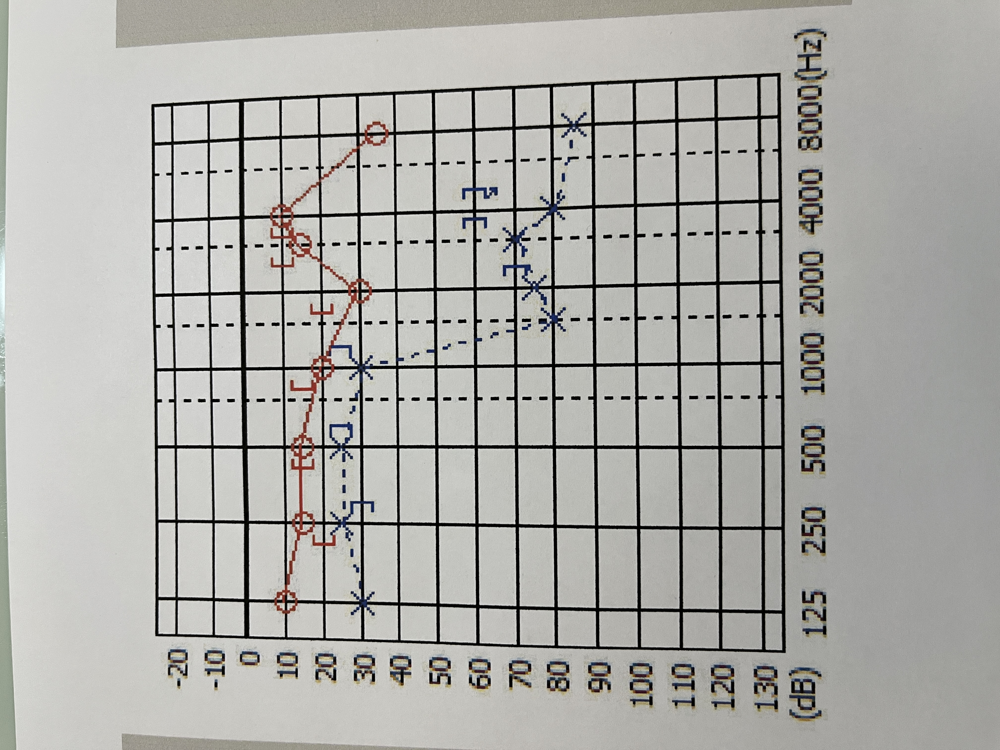

In [6]:
#original .jpg audiogram photo image
display(Image(filename="../data/datasets/test_datasets/original/image/ICOPY091_photo.JPG"))


In [7]:
''' 
Extract the second largest rectangle and resize it to a 416 x 416 pixel image.

'''
from utilities.general.extract_resize2rect416image import extract2ndrect_resize416x416

ORIGINAL_IMAGE_FILEPATH = "../data/datasets/test_datasets/original/image/*"
REC2NDRESIZE416X416_SAVE_DIR = "../results/rect416images"
extract2ndrect_resize416x416(ORIGINAL_IMAGE_FILEPATH,REC2NDRESIZE416X416_SAVE_DIR)

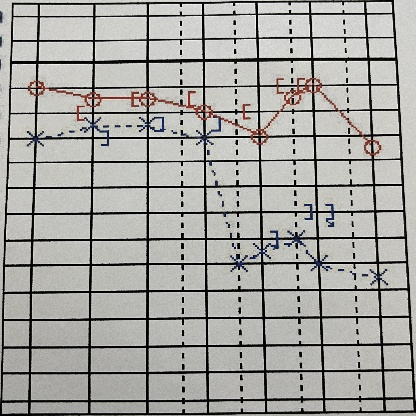

In [8]:
#converted rect416 audiogram photo image
display(Image(filename="../results/rect416images/ICOPY091_photo.jpg"))


In [9]:
''' 
rect416DETR model (trained by datasetA) prediction results
'''

' \nrect416DETR model (trained by datasetA) prediction results\n'

In [10]:
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torch import nn
import torchvision.transforms as T
import time
import os, glob
# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

CLASSES = [
  'a0','a1','a2','a3','a4'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
# model load
model = torch.hub.load('facebookresearch/detr',
                      'detr_resnet50',
                      pretrained=False,
                      num_classes=5)
model = model.to(device)  # Move model to the device

checkpoint = torch.load('../data/models/rect416DETR_audiogramdetr_checkpoint0499.pth', map_location=device)
model.load_state_dict(checkpoint['model'], strict=False)
model.eval()

/Users/tesutoyoukanrisha/python_envs/codeocean_audiogram1_env/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using cache found in /Users/tesutoyoukanrisha/.cache/torch/hub/facebookresearch_detr_main
/Users/tesutoyoukanrisha/python_envs/codeocean_audiogram1_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/tesutoyoukanrisha/python_envs/codeocean_audiogram1_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`

DETR(
  (transformer): Transformer(
    (encoder): TransformerEncoder(
      (layers): ModuleList(
        (0): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048, out_features=256, bias=True)
          (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
        (1): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_f

In [11]:
from utilities.DETR.rect416DETRprediction1 import predict_detr_testdata
IMAGE_FILE_PATH ='../results/rect416images/*.jpg'
OUTPUT_DIR='../results/rect416images/labels'
predict_detr_testdata(IMAGE_FILE_PATH,OUTPUT_DIR)

Using cache found in /Users/tesutoyoukanrisha/.cache/torch/hub/facebookresearch_detr_main


In [12]:
''' 
Redraw the standardized audiogram

'''

' \nRedraw the standardized audiogram\n\n'

In [13]:
# To redraw a full audiogram in a standardized manner
from utilities.general.drawingfullgraph_rect416 import draw_RL_full_linedotgraph

YOLOIMG_FILE_PATH = '../results/rect416images/*.jpg'
FULLGRAPH_SAVE_DIR= '../results/rect416images_redrawn_DETR'

draw_RL_full_linedotgraph(YOLOIMG_FILE_PATH, FULLGRAPH_SAVE_DIR)

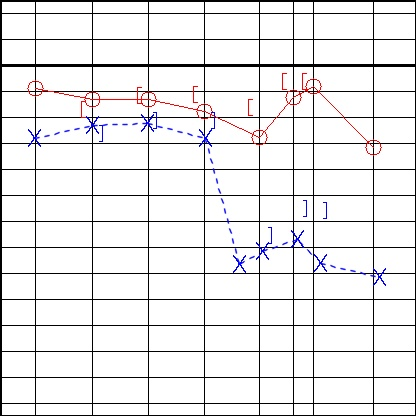

In [14]:
#Show the redrawn standardized audiogram
from IPython.display import Image, display
display(Image(filename="../results/rect416images_redrawn_DETR/ICOPY091_photo.jpg"))


In [15]:
''' 
rect416YOLO model (trained by datasetA) prediction results
'''

' \nrect416YOLO model (trained by datasetA) prediction results\n'

In [16]:
# To annotate each threshold sign in a rect416 image by rect416YOLOv5x model trained with datasetA
start = time.time()
print(start)
%cd yolov5
FILE_PATH = "../../results/rect416images/*.jpg"
SAVE_DIRECTORY_PATH = '../../results/yolodetect_save_dir'
proc = subprocess.Popen(['python','detect.py', '--weights', '../../data/models/rect416YOLO_audiogramdetr2yolo_best_20241023.pt', '--SAVE_PATH', SAVE_DIRECTORY_PATH ,'--img', '416', '--conf', '0.80', '--source', FILE_PATH, '--save-txt'])
proc.wait()

#end
elapsed_time = time.time() - start
print ("elapsed_time:{0}".format(elapsed_time) + "[sec]")
%cd ..

1736616659.061295
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/yolov5


detect: weights=['../../data/models/rect416YOLO_audiogramdetr2yolo_best_20241023.pt'], source=../../results/rect416images/*.jpg, SAVE_PATH=../../results/yolodetect_save_dir, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.8, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 2024-12-11 Python-3.10.6 torch-1.13.1 CPU

Fusing layers... 
YOLOv5x summary: 322 layers, 86200330 parameters, 0 gradients
image 1/38 /Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/results/rect416images/100.jpg: 416x416 8 a0s, 6 a1s, 8 a2s, 133.8ms
image 2/38 /Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/results/rect416images/91.jpg: 416x416 8 a0s, 6 a1s, 8 a2s, 167.9ms
image 3/38 /Users/tesutoyo

elapsed_time:8.165531873703003[sec]
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code


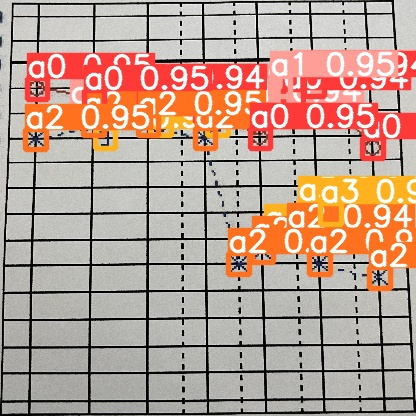

In [17]:
#YOLO detection result
from IPython.display import Image, display
display(Image(filename="../results/yolodetect_save_dir/ICOPY091_photo.jpg"))


In [18]:
# To redraw a full audiogram in a standardized manner
from utilities.general.drawingfullgraph_rect416 import draw_RL_full_linedotgraph

YOLOIMG_FILE_PATH = '../results/yolodetect_save_dir/*.jpg'
FULLGRAPH_SAVE_DIR= '../results/rect416images_redrawn_YOLO'

draw_RL_full_linedotgraph(YOLOIMG_FILE_PATH, FULLGRAPH_SAVE_DIR)

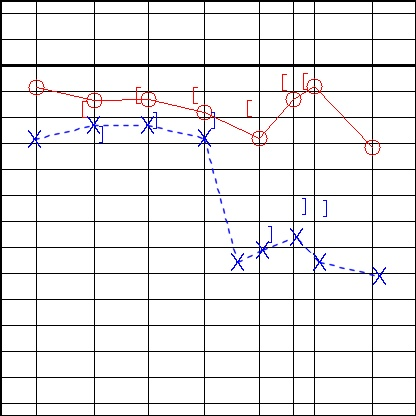

In [19]:
#Show the redrawn standardized audiogram
from IPython.display import Image, display
display(Image(filename="../results/rect416images_redrawn_YOLO/ICOPY091_photo.jpg"))


In [20]:
''' 
Table 1 and Fig. 6 reproduction from DETR/YOLO detection results

'''

' \nTable 1 and Fig. 6 reproduction from DETR/YOLO detection results\n\n'

In [21]:
#test dataset preparation: rect416 test dataset

In [22]:
from utilities.general.confusionmatrix_testdataset import yolo2df
YOLOTXTFILEDIR = "../data/datasets/test_datasets/rect416/text/*.txt"
df_rect416test = yolo2df(YOLOTXTFILEDIR)
df_rect416test.describe()

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

,label,x,y
count,970.000000,970.000000,970.000000
mean,1.496907,0.536452,0.428564
std,1.186652,0.247516,0.165874
min,0.000000,0.070913,0.098558
25%,0.000000,0.355769,0.299279
50%,2.000000,0.599159,0.409255
75%,2.000000,0.738882,0.534856
max,4.000000,0.927885,0.854567


In [23]:
#test dataset preparation: original test dataset
YOLOTXTFILEDIR = "../data/datasets/test_datasets/original/text/*.txt"
df_originaltest = yolo2df(YOLOTXTFILEDIR)
df_originaltest.describe()

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

,label,x,y
count,963.000000,963.000000,963.000000
mean,1.496366,0.538224,0.422654
std,1.186697,0.195534,0.143092
min,0.000000,0.075721,0.109937
25%,0.000000,0.399337,0.319712
50%,2.000000,0.557692,0.413938
75%,2.000000,0.687500,0.511776
max,4.000000,0.924279,0.837740


In [24]:
''' 
Fig. 6A: rect416DETR model using rect416 test dataset
'''

' \nFig. 6A: rect416DETR model using rect416 test dataset\n'

In [25]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6a/*.txt"
rect416DETR_rect416testdf = yolo2df(YOLOTXTFILEDIR)

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 5 (x=0.92649, y=0.59545): x_diff=0.001, y_diff=0.002, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 17 (x=0.78434, y=0.56552): x_diff=0.002, y_diff=0.001, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 0 (x=0.07237, y=0.43942): x_diff=0.002, y_diff=0.000, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 2 (x=0.72669, y=0.5365): x_diff=0.001, y_diff=0.002, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 19 (x=0.64326, y=0.40881): x_diff=0.001, y_diff=0.000, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 10 (x=0.21463, y=0.44038): x_diff=0.002, y_diff=0.000, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 1 (x=0.50031, y=0.31575): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 6 (x=0.3585

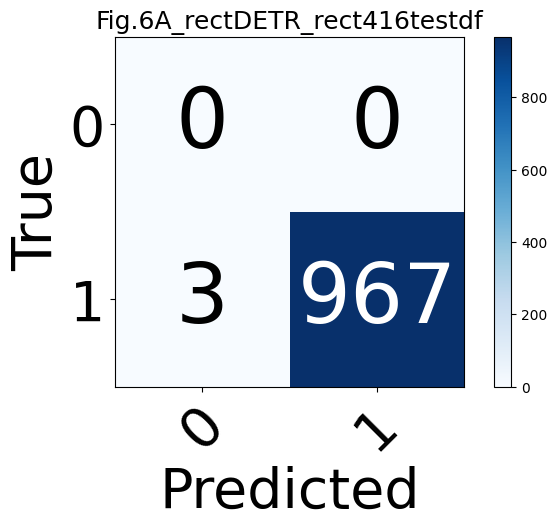

Recall (Sensitivity) =  1.00
Precision(PPV) =     1.00
EDR = 0.3


In [26]:
from utilities.general.confusionmatrix_testdataset import analysis2confusionmatrix
analysis2confusionmatrix(df_rect416test, rect416DETR_rect416testdf,"Fig.6A_rectDETR_rect416testdf")

In [27]:
''' 
Fig. 7A: rect416DETR using original test dataset with photo images (produce many false positives and false negatives)
rect416DETR using original test image with photos
'''

' \nFig. 7A: rect416DETR using original test dataset with photo images (produce many false positives and false negatives)\nrect416DETR using original test image with photos\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 2 (x=0.72636, y=0.5335): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 9 (x=0.5175, y=0.32467): x_diff=0.002, y_diff=0.000, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 15 (x=0.38678, y=0.35354): x_diff=0.002, y_diff=0.000, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 17 (x=0.90825, y=0.59114): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 12 (x=0.12762, y=0.44139): x_diff=0.001, y_diff=0.000, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 19 (x=0.65059, y=0.41242): x_diff=0.001, y_diff=0.000, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 8 (x=0.25595, y=0.44106): x_diff=0.003, y_diff=0.001, within_tolerance=True

Reference row index 8 (100, 1):
  -> Detected row index 6 (x=0.7519

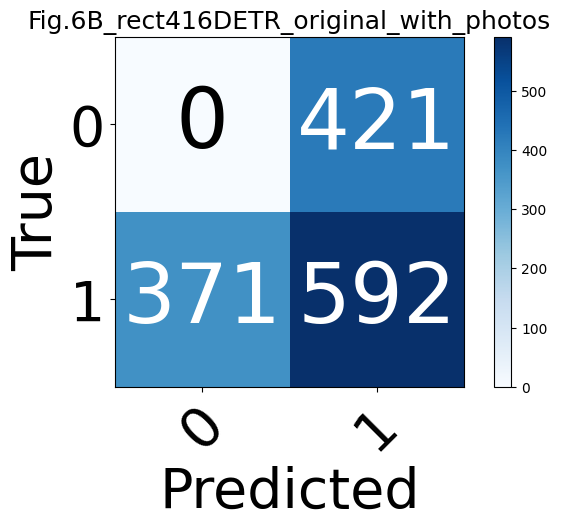

Recall (Sensitivity) =  0.61
Precision(PPV) =     0.58
EDR = 133.8


In [28]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig7_with_photos/*.txt"
rect416DETR_originaltestdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_originaltest, rect416DETR_originaltestdf,"Fig.6B_rect416DETR_original_with_photos")

In [29]:
''' 
Fig.7B: show the false negatives and false positives by rect416DETR model with original test dataset with photos
'''

' \nFig.7B: show the false negatives and false positives by rect416DETR model with original test dataset with photos\n'

In [30]:
from utilities.general.drawingfullgraph_rect416 import draw_RL_full_linedotgraph

YOLOIMG_FILE_PATH = '../data/fig7/*.jpg'
FULLGRAPH_SAVE_DIR= '../results/fig7'

draw_RL_full_linedotgraph(YOLOIMG_FILE_PATH, FULLGRAPH_SAVE_DIR)

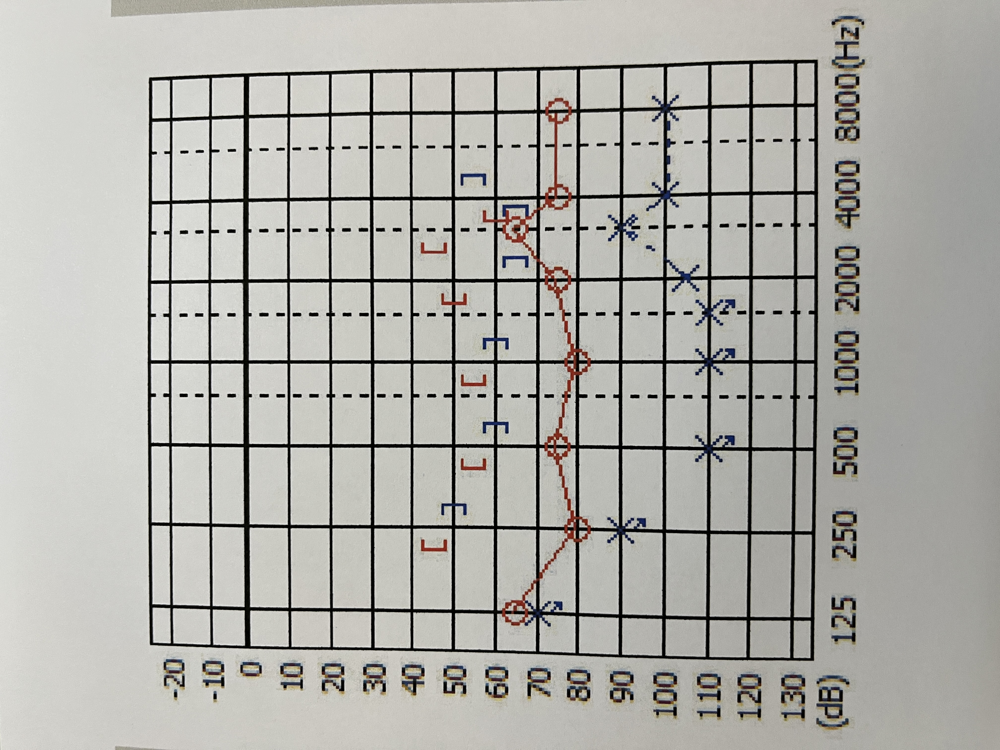

In [31]:
#show the original test image
from IPython.display import Image, display
display(Image(filename="../data/fig7/ICOPY094_photo.jpg"))


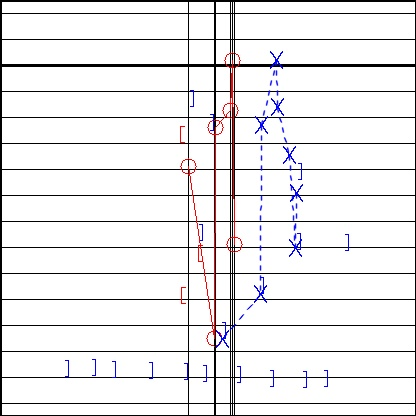

In [32]:
#show the predicted image
from IPython.display import Image, display
display(Image(filename="../results/fig7/ICOPY094_photo.jpg"))



In [33]:
''' 
Fig. 6B without photo images 
rect416DETR using original test image without photos
'''

' \nFig. 6B without photo images \nrect416DETR using original test image without photos\n'

In [34]:
YOLOTXTFILEDIR = "../data/datasets/test_datasets/original_wo_photos/text/*.txt"
df_originaltest_wo_photos = yolo2df(YOLOTXTFILEDIR)
df_originaltest_wo_photos.describe()

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

,label,x,y
count,686.000000,686.000000,686.000000
mean,1.482507,0.535361,0.407642
std,1.190774,0.196546,0.152830
min,0.000000,0.075721,0.109937
25%,0.000000,0.399338,0.283654
50%,2.000000,0.550955,0.401442
75%,2.000000,0.673218,0.500000
max,4.000000,0.924279,0.837740


/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 2 (x=0.72636, y=0.5335): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 9 (x=0.5175, y=0.32467): x_diff=0.002, y_diff=0.000, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 15 (x=0.38678, y=0.35354): x_diff=0.002, y_diff=0.000, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 17 (x=0.90825, y=0.59114): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 12 (x=0.12762, y=0.44139): x_diff=0.001, y_diff=0.000, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 19 (x=0.65059, y=0.41242): x_diff=0.001, y_diff=0.000, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 8 (x=0.25595, y=0.44106): x_diff=0.003, y_diff=0.001, within_tolerance=True

Reference row index 8 (100, 1):
  -> Detected row index 6 (x=0.7519

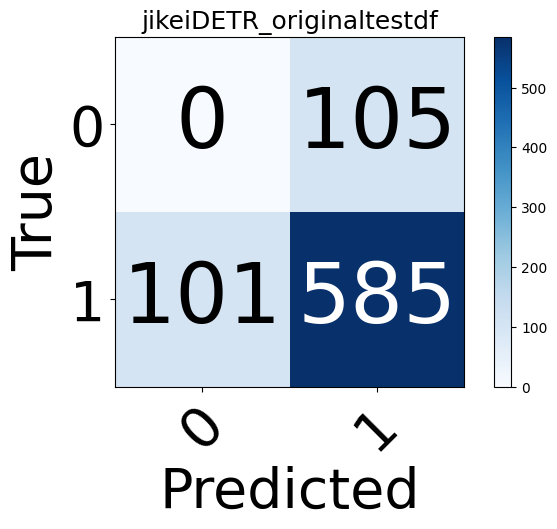

Recall (Sensitivity) =  0.85
Precision(PPV) =     0.85
EDR = 35.2


In [35]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6b_without_photos/*.txt"
rect416DETR_originaltestdf_wo_photos = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_originaltest_wo_photos, rect416DETR_originaltestdf_wo_photos,"jikeiDETR_originaltestdf")

In [36]:
''' 
Fig. 6C 
rect416YOLO using rect416 test dataset
'''

' \nFig. 6C \nrect416YOLO using rect416 test dataset\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 7 (x=0.926683, y=0.596154): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 19 (x=0.784856, y=0.563702): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 17 (x=0.0733173, y=0.439904): x_diff=0.001, y_diff=0.000, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 11 (x=0.727163, y=0.534856): x_diff=0.001, y_diff=0.000, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 18 (x=0.643029, y=0.409856): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 16 (x=0.216346, y=0.439904): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 15 (x=0.501202, y=0.317308): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected ro

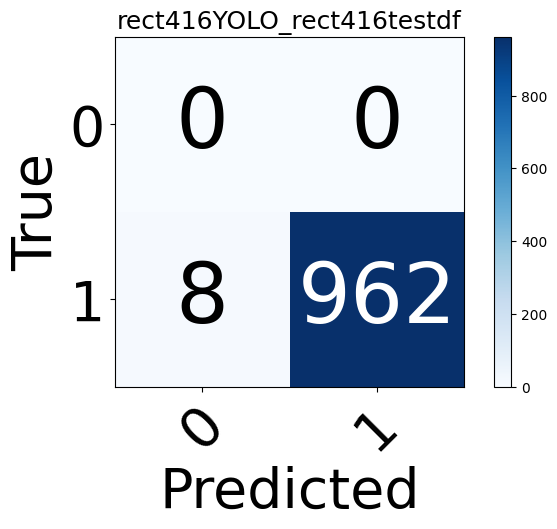

Recall (Sensitivity) =  0.99
Precision(PPV) =     1.00
EDR = 0.8


In [37]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6c/*.txt"
rect416YOLO_rect416testdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_rect416test, rect416YOLO_rect416testdf,"rect416YOLO_rect416testdf")

In [38]:
''' 
Fig. 6D 
rect416YOLO using original test dataset
'''

' \nFig. 6D \nrect416YOLO using original test dataset\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 8 (x=0.725513, y=0.532495): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 11 (x=0.520501, y=0.324948): x_diff=0.001, y_diff=0.000, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 15 (x=0.388383, y=0.353249): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 14 (x=0.779043, y=0.560797): x_diff=0.000, y_diff=0.001, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 12 (x=0.908884, y=0.591195): x_diff=0.000, y_diff=0.001, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 16 (x=0.129841, y=0.442348): x_diff=0.001, y_diff=0.001, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 18 (x=0.649203, y=0.412998): x_diff=0.000, y_diff=0.001, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row

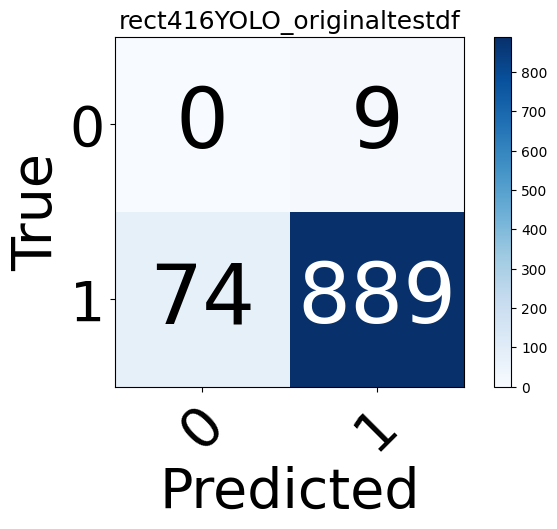

Recall (Sensitivity) =  0.92
Precision(PPV) =     0.99
EDR = 9.3


In [39]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6d/*.txt"
rect416YOLO_originaltestdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_originaltest, rect416YOLO_originaltestdf,"rect416YOLO_originaltestdf")

In [ ]:
''' 
Fig. 6E
originalDETR using rect416 test dataset
the confusion matrix data was convereted from aa0-aa6 to a0-a4
'''

' \nFig. 6E\noriginalDETR using rect416 test dataset\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 3 (x=0.92328, y=0.59239): x_diff=0.002, y_diff=0.005, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 7 (x=0.78431, y=0.5625): x_diff=0.002, y_diff=0.002, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 6 (x=0.07168, y=0.43736): x_diff=0.003, y_diff=0.003, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 2 (x=0.72375, y=0.52944): x_diff=0.002, y_diff=0.005, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 4 (x=0.64216, y=0.40551): x_diff=0.000, y_diff=0.003, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 0 (x=0.21353, y=0.43717): x_diff=0.003, y_diff=0.003, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 1 (x=0.49987, y=0.31318): x_diff=0.000, y_diff=0.003, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 5 (x=0.35593, 

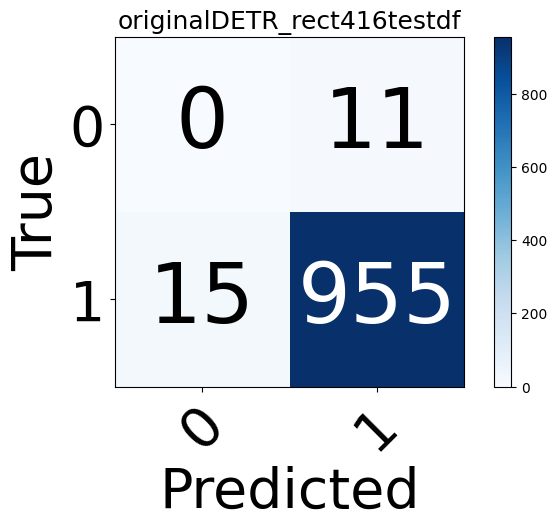

Recall (Sensitivity) =  0.98
Precision(PPV) =     0.99
EDR = 2.7


In [41]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6e/*.txt"
originalDETR_rect416testdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_rect416test, originalDETR_rect416testdf,"originalDETR_rect416testdf")

In [ ]:
''' 
Fig. 6F
originalDETR using original test dataset without photos
the confusion matrix data was convereted from aa0-aa6 to a0-a4
'''

' \nFig. 6F\noriginalDETR using original test dataset without photos\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 2 (x=0.72782, y=0.52868): x_diff=0.002, y_diff=0.004, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 6 (x=0.52077, y=0.32184): x_diff=0.001, y_diff=0.003, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 5 (x=0.39137, y=0.34971): x_diff=0.003, y_diff=0.004, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 7 (x=0.78427, y=0.5584): x_diff=0.005, y_diff=0.003, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 3 (x=0.90748, y=0.58768): x_diff=0.001, y_diff=0.002, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 0 (x=0.13037, y=0.43782): x_diff=0.002, y_diff=0.003, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 4 (x=0.65043, y=0.40951): x_diff=0.001, y_diff=0.002, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 1 (x=0.26099, 

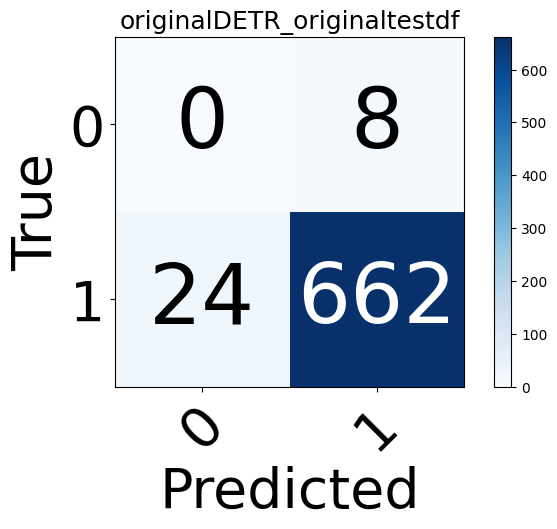

Recall (Sensitivity) =  0.97
Precision(PPV) =     0.99
EDR = 4.8


In [43]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6f/*.txt"
originalDETR_originaltestdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_originaltest_wo_photos, originalDETR_originaltestdf,"originalDETR_originaltestdf")

In [ ]:
''' 
Fig. 6G
originalYOLO (confidence rate = 0.3) using rect416 test dataset
the confusion matrix data was convereted from aa0-aa6 to a0-a4
'''

' \nFig. 6G\noriginalYOLO (confidence rate = 0.3) using rect416 test dataset\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 0 (x=0.925481, y=0.597356): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 1 (x=0.786058, y=0.564904): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 2 (x=0.0745192, y=0.439904): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 3 (x=0.725962, y=0.534856): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 4 (x=0.641827, y=0.408654): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 5 (x=0.216346, y=0.439904): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 6 (x=0.5, y=0.316106): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 7 (

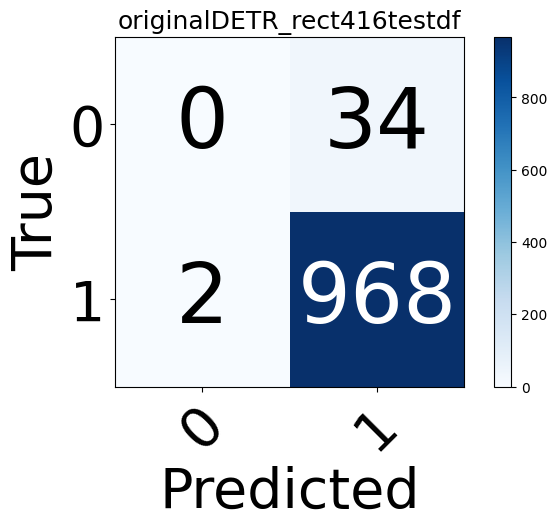

Recall (Sensitivity) =  1.00
Precision(PPV) =     0.97
EDR = 3.7


In [45]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6g/*.txt"
originalYOLO_rect416testdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_rect416test, originalYOLO_rect416testdf,"originalDETR_rect416testdf")

In [ ]:
''' 
Fig. 6H: Conventional model
originalYOLO (confidence rate = 0.3) using original test dataset
the confusion matrix data was convereted from aa0-aa6 to a0-a4
'''

' \nFig. 6H: Conventional model\noriginalYOLO (confidence rate = 0.3) using original test dataset\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 0 (x=0.725513, y=0.532495): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 1 (x=0.519362, y=0.324948): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 2 (x=0.388383, y=0.353249): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 3 (x=0.779043, y=0.561845): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 4 (x=0.908884, y=0.590147): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 5 (x=0.128702, y=0.4413): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 6 (x=0.649203, y=0.41195): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 7 

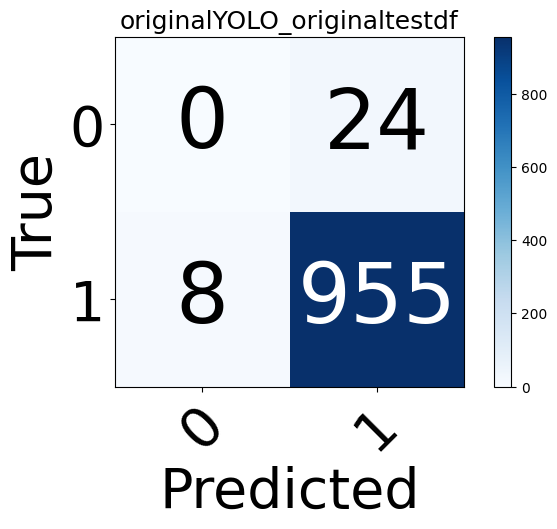

Recall (Sensitivity) =  0.99
Precision(PPV) =     0.98
EDR = 3.4


In [47]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6h/*.txt"
originalYOLO_originaltestdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_originaltest, originalYOLO_originaltestdf,"originalYOLO_originaltestdf")

In [ ]:
''' 
Fig. 6I
originalYOLO (confidence rate = 0.8) using rect416 test dataset
the confusion matrix data was convereted from aa0-aa6 to a0-a4
'''

' \nFig. 6I\noriginalYOLO (confidence rate = 0.8) using rect416 test dataset\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 0 (x=0.925481, y=0.597356): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 1 (x=0.786058, y=0.564904): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 2 (x=0.0745192, y=0.439904): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 3 (x=0.725962, y=0.534856): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 4 (x=0.641827, y=0.408654): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 5 (x=0.216346, y=0.439904): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 6 (x=0.5, y=0.316106): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 7 (

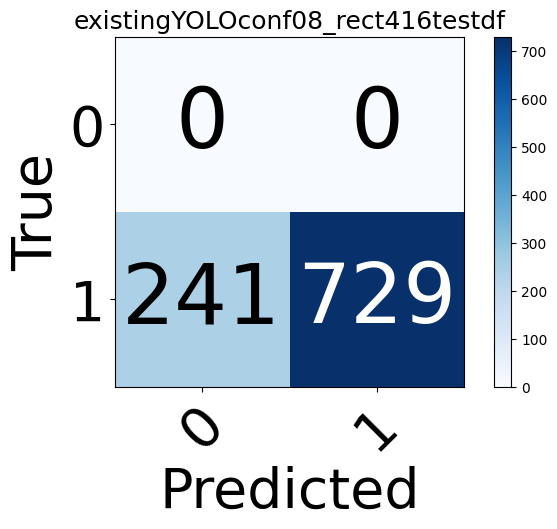

Recall (Sensitivity) =  0.75
Precision(PPV) =     1.00
EDR = 33.1


In [49]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6i/*.txt"
existingYOLOconf08_rect416testdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_rect416test, existingYOLOconf08_rect416testdf,"existingYOLOconf08_rect416testdf")

In [ ]:
''' 
Fig. 6J
originalYOLO (confidence rate = 0.8) using original test dataset
the confusion matrix data was convereted from aa0-aa6 to a0-a4
'''

' \nFig. 6J\noriginalYOLO (confidence rate = 0.8) using original test dataset\n'

/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append([item],ignore_index=True)
/Users/tesutoyoukanrisha/studioーGitHub/CodeOceanAudiogram2/code/utilities/general/confusionmatrix_testdataset.py:33: FutureWarn

Reference row index 0 (100, 0):
  -> Detected row index 0 (x=0.725513, y=0.532495): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 1 (100, 0):
  -> Detected row index 1 (x=0.519362, y=0.324948): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 2 (100, 0):
  -> Detected row index 2 (x=0.388383, y=0.353249): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 3 (100, 0):
  -> Detected row index 3 (x=0.779043, y=0.561845): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 4 (100, 0):
  -> Detected row index 4 (x=0.908884, y=0.590147): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 5 (100, 0):
  -> Detected row index 5 (x=0.128702, y=0.4413): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 6 (100, 0):
  -> Detected row index 6 (x=0.649203, y=0.41195): x_diff=0.000, y_diff=0.000, within_tolerance=True

Reference row index 7 (100, 0):
  -> Detected row index 7 

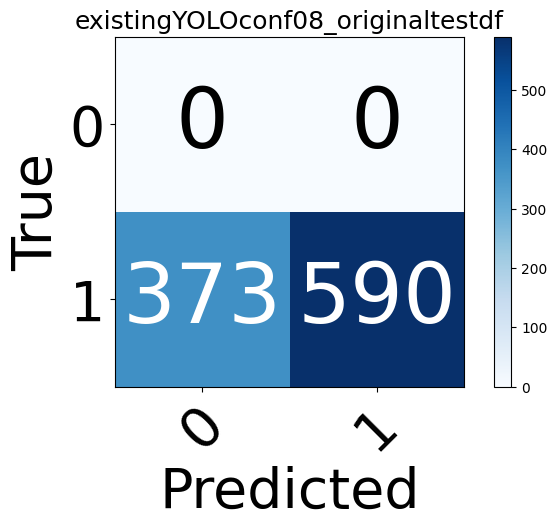

Recall (Sensitivity) =  0.61
Precision(PPV) =     1.00
EDR = 63.2


In [51]:
YOLOTXTFILEDIR = "../data/confusionmatrix_data/fig6j/*.txt"
existingYOLOconf08_originaltestdf = yolo2df(YOLOTXTFILEDIR)
analysis2confusionmatrix(df_originaltest, existingYOLOconf08_originaltestdf,"existingYOLOconf08_originaltestdf")